<a href="https://colab.research.google.com/github/johanhoffman/DD2365_VT23/blob/jonahaag_lab4/Lab4/jonahaag_lab4_ALE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **The Navier-Stokes equations - ALE**
**Jonathan Haag**

# **Abstract**

This short report show an example on how to use FEniCS to solve the Navier-Stokes equations using an ALE method, which is used in the course DD2365 Advanced Computation in Fluid Mechanics, at the KTH Royal Institute of Technology.

[DD2365 course website.](https://www.kth.se/social/course/DD2365/)

# **About the code**

In [288]:
"""This program is an example file for the course"""
"""DD2365 Advanced Computation in Fluid Mechanics, """
"""KTH Royal Institute of Technology, Stockholm, Sweden."""

# Copyright (C) 2023 Johan Hoffman (jhoffman@kth.se), Jonathan Haag (jmhaag@kth.se)

# This file is part of the course DD2365 Advanced Computation in Fluid Mechanics
# KTH Royal Institute of Technology, Stockholm, Sweden
#
# This is free software: you can redistribute it and/or modify
# it under the terms of the GNU Lesser General Public License v2.

# This template is maintained by Johan Hoffman
# Please report problems to jhoffman@kth.se

'KTH Royal Institute of Technology, Stockholm, Sweden.'

# **Set up environment**

In [289]:
# Load neccessary modules.
from google.colab import files

import numpy as np
import time

# Install FEniCS (this may take a long time)
try:
    import dolfin
except ImportError:
    !wget "https://fem-on-colab.github.io/releases/fenics-install.sh" -O "/tmp/fenics-install.sh" && bash "/tmp/fenics-install.sh"
    import dolfin
    
from dolfin import *; from mshr import *

import dolfin.common.plotting as fenicsplot

from matplotlib import pyplot as plt

# **Introduction**

The Navier-Stokes equations take the form

$\dot u + (u\cdot \nabla)u + \nabla p -\Delta u = f,\quad \nabla \cdot u=0,$

together with suitable initial and boundary conditions.

Here we present a FEniCS implementation of a stabilized space-time Arbitrary Lagrangian-Eulerian (ALE) finite element method to solve the Navier-Stokes equations in 2D. The solution is visualized using FEniCS plotting functions, and is also exported as pvd-files which can be visualized in Paraview.

We seek a finite element approximation $(u,p)\in V\times Q$ such that 

$(\dot u + ((u-m)\cdot \nabla)u, v) - (p,\nabla \cdot v) + (\nu \nabla u,\nabla v) + (\nabla \cdot u, q) + SD(u,p;v,q) = (f,v),$

for all test functions $(v,q) \in \hat V\times \hat Q$, where $SD(u,p;v,q)$ is a residual based stabilization term. The mesh velocity is denoted by m. 

We present an example of flow past a circular cylinder, for which we compute the force on the surface of the cylinder $\Gamma$ in the direction $\phi$, by Green's formula: 

$
F(u,p,\phi)= ~<\nu \nabla u\cdot n-pn, \Phi>_{\Gamma} ~=~(\dot u+(u\cdot \nabla)u, \Phi) + (\nu \nabla u,\nabla \Phi) - (p,\nabla \cdot\Phi)-(f,\Phi),
$

with $\Phi\in V$ a fuinction for which $\Phi\vert _{\Gamma}=\phi$ and $\Phi\vert_{\partial \Omega \setminus \Gamma}=0$. With $\phi=(1,0)$ we get the drag force $F_D$, and with $\phi=(0,1)$ the lift force $F_L$. The drag and lift coefficients are obtained by normalization, 

$
c_D = \frac{2F_D}{\rho U^2D}, \quad c_L = \frac{2F_L}{\rho U^2D}
$

where $\rho$ is the density (here $\rho=1$), $U$ the characteristic velocity (here $U=1$), and $D$ the characteristic length scale (here $D$ is the diameter of the cylinder). 

The Reynolds number is defined as $Re=\frac{UD}{\nu}$

To read more about how to use similar methods for more complex problems, see e.g. 

[Hoffman, Johan, et al. "Towards a parameter-free method for high reynolds number turbulent flow simulation based on adaptive finite element approximation." Computer Methods in Applied Mechanics and Engineering 288 (2015): 60-74.](https://www.sciencedirect.com/science/article/pii/S0045782514004836)


# **Method**

**Define domain and mesh**

In [ ]:
# Define rectangular domain 
L = 4
H = 2

# Define circle
xc = 1.0
yc = 0.5*H
rc = 0.2

# Define subdomains (for boundary conditions)
class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0.0) 

class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L)

class Lower(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0.0)

class Upper(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], H)
      
left = Left()
right = Right()
lower = Lower()
upper = Upper()

# Generate mesh (examples with and without a hole in the mesh) 
resolution = 32
#mesh = RectangleMesh(Point(0.0, 0.0), Point(L, H), L*resolution, H*resolution)
mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), resolution)

# Local mesh refinement (specified by a cell marker)
no_levels = 0
for i in range(0,no_levels):
  cell_marker = MeshFunction("bool", mesh, mesh.topology().dim())
  for cell in cells(mesh):
    cell_marker[cell] = False
    p = cell.midpoint()
    if p.distance(Point(xc, yc)) < 1.0:
        cell_marker[cell] = True
  mesh = refine(mesh, cell_marker)

# Define mesh functions (for boundary conditions)
boundaries = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
boundaries.set_all(0)
left.mark(boundaries, 1)
right.mark(boundaries, 2)
lower.mark(boundaries, 3)
upper.mark(boundaries, 4)

plt.figure()
plot(mesh)
plt.show()

**Define finite element approximation spaces**

In [291]:
# Generate finite element spaces (for velocity and pressure)
V = VectorFunctionSpace(mesh, "Lagrange", 1)
Q = FunctionSpace(mesh, "Lagrange", 1)

# Define trial and test functions 
u = TrialFunction(V)
p = TrialFunction(Q)
v = TestFunction(V)
q = TestFunction(Q)

**Define boundary conditions**

In [292]:
# Define boundary conditions 
class DirichletBoundaryLower(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 0.0)

class DirichletBoundaryUpper(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], H)

class DirichletBoundaryLeft(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0) 

class DirichletBoundaryRight(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], L)

class DirichletBoundaryObjects(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and (not near(x[0], 0.0)) and (not near(x[0], L)) and (not near(x[1], 0.0)) and (not near(x[1], H))

dbc_lower = DirichletBoundaryLower()
dbc_upper = DirichletBoundaryUpper()
dbc_left = DirichletBoundaryLeft()
dbc_right = DirichletBoundaryRight()
dbc_objects = DirichletBoundaryObjects()

# Examples of time dependent and stationary inflow conditions
#uin = Expression('4.0*x[1]*(1-x[1])', element = V.sub(0).ufl_element())
#uin = Expression('1.0 + 1.0*fabs(sin(t))', element = V.sub(0).ufl_element(), t=0.0)
uin = 1.0
bcu_in0 = DirichletBC(V.sub(0), uin, dbc_left)
bcu_in1 = DirichletBC(V.sub(1), 0.0, dbc_left)
bcu_upp0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
bcu_upp1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
bcu_low0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
bcu_low1 = DirichletBC(V.sub(1), 0.0, dbc_lower)
bcu_obj0 = DirichletBC(V.sub(0), 0.0, dbc_objects)
bcu_obj1 = DirichletBC(V.sub(1), 0.0, dbc_objects)

pin = Expression('5.0*fabs(sin(t))', element = Q.ufl_element(), t=0.0)
pout = 0.0
#bcp0 = DirichletBC(Q, pin, dbc_left) 
bcp1 = DirichletBC(Q, pout, dbc_right)

#bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
bcu = [bcu_in0, bcu_in1, bcu_upp1, bcu_low1, bcu_obj0, bcu_obj1]
bcp = [bcp1]

# Define measure for boundary integration  
ds = Measure('ds', domain=mesh, subdomain_data=boundaries)

# **Results**

**Define flow parameters**

In [293]:
# Set viscosity
nu = 4.0e-3

**Define method parameters**

In [294]:
# Define iteration functions
# (u0,p0) solution from previous time step
# (u1,p1) linearized solution at present time step  
u0 = Function(V)
u1 = Function(V)
p0 = Function(Q)
p1 = Function(Q)

# Define mesh deformation w, mesh velocity = w/dt
amp_x = 0.0
amp_y = 1.0e-2
freq = 0.1
t = 0.0

# Move and deform
# w = Expression(("amp_x*sin(2.0*pi*t*freq)*sin(pi*x[0]/L)","amp_y*sin(2.0*pi*t*freq-0.5*pi)*sin(pi*x[1]/H)"), L=L, H=H, t=t, amp_x=amp_x, amp_y=amp_y, freq=freq, element = V.ufl_element())

# Deform only
#amp_y = 0.005
#w = Expression(("amp_x*sin(2.0*pi*t*freq)*sin(pi*x[0]/L)","amp_y*sin(2.0*pi*t*freq-0.5*pi)*sin(pi*(x[1]-H/2))"), L=L, H=H, t=t, amp_x=amp_x, amp_y=amp_y, freq=freq, element = V.ufl_element())

# Mesh smoothing
def compute_displacement(mesh, t, dt, T):

  ''' Compute the elastic response based on the cylinder position'''

  # Generate finite element space
  VE_elastic = VectorElement("CG", mesh.ufl_cell(), 1)

  V_elastic = FunctionSpace(mesh, VE_elastic)

  # Define trial and test functions
  u_elastic = TrialFunction(V_elastic)
  v_elastic = TestFunction(V_elastic) 

  d = Function(V_elastic)

  dbc_lower_elastic = DirichletBoundaryLower()
  dbc_upper_elastic = DirichletBoundaryUpper()
  dbc_left_elastic = DirichletBoundaryLeft()
  dbc_right_elastic = DirichletBoundaryRight()
  dbc_objects_elastic = DirichletBoundaryObjects()

  def compute_movement(t, dt, a, f):
    return a * (np.sin(2.0*np.pi*t*f) - np.sin(2.0*np.pi*(t-dt)*f))

  bcu_left0_elastic = DirichletBC(V_elastic.sub(0), 0.0, dbc_left_elastic)
  bcu_left1_elastic = DirichletBC(V_elastic.sub(1), 0.0, dbc_left_elastic)
  bcu_right0_elastic = DirichletBC(V_elastic.sub(0), 0.0, dbc_right_elastic)
  bcu_right1_elastic = DirichletBC(V_elastic.sub(1), 0.0, dbc_right_elastic)
  bcu_upper0_elastic = DirichletBC(V_elastic.sub(0), 0.0, dbc_upper_elastic)
  bcu_upper1_elastic = DirichletBC(V_elastic.sub(1), 0.0, dbc_upper_elastic)
  bcu_lower0_elastic = DirichletBC(V_elastic.sub(0), 0.0, dbc_lower_elastic)
  bcu_lower1_elastic = DirichletBC(V_elastic.sub(1), 0.0, dbc_lower_elastic)
  bcu_obj0_elastic = DirichletBC(V_elastic.sub(0), compute_movement(t, dt, 1.0, 1/(2*T)), dbc_objects_elastic)
  bcu_obj1_elastic = DirichletBC(V_elastic.sub(1), compute_movement(t, dt, 0.2, 0.1), dbc_objects_elastic)

  #bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
  bcu_elastic = [bcu_left0_elastic, bcu_left1_elastic, bcu_right0_elastic, bcu_right1_elastic, bcu_upper0_elastic,
                 bcu_upper1_elastic, bcu_lower0_elastic, bcu_lower1_elastic, bcu_obj0_elastic, bcu_obj1_elastic]

  f = Expression(("0.0","0.0"), element = V_elastic.ufl_element())

  dim = u_elastic.geometric_dimension()
  E = 1.0e10
  nu = 0.3
  mu = E*0.5/(1+nu)
  lambda_ = nu*E/((1.0+nu)*(1.0-2.0*nu))

  def epsilon(u_elastic):
      return 0.5*(grad(u_elastic) + grad(u_elastic).T)

  def sigma(u_elastic):
      #return 2.0*mu*epsilon(u)
      return lambda_*div(u_elastic)*Identity(dim) + 2.0*mu*epsilon(u_elastic)

  # Define variational problem on residual form: r(u,v) = 0
  residual_elastic = ( inner(sigma(u_elastic), epsilon(v_elastic))*dx - inner(f, v_elastic)*dx )

  au_elastic = lhs(residual_elastic)
  Lu_elastic = rhs(residual_elastic)

  A_elastic = assemble(au_elastic)
  b_elastic = assemble(Lu_elastic)

  [bc.apply(A_elastic, b_elastic) for bc in bcu_elastic]
  [bc.apply(d.vector()) for bc in bcu_elastic]

  solve(A_elastic, d.vector(), b_elastic, "bicgstab", "default")

  return d, V

# Set parameters for nonlinear and lienar solvers 
num_nnlin_iter = 5 
prec = "amg" if has_krylov_solver_preconditioner("amg") else "default" 

# Time step length 
dt = 0.5*mesh.hmin() 

**Define variational problem**

In [295]:
# Define variational problem

# Stabilization parameters
h = CellDiameter(mesh);
u_mag = sqrt(dot(u1,u1))
d1 = 1.0/sqrt((pow(1.0/dt,2.0) + pow(u_mag/h,2.0)))
d2 = h*u_mag

# Mean velocities for trapozoidal time stepping
um = 0.5*(u + u0)
um1 = 0.5*(u1 + u0)

# Momentum variational equation on residual form
#Fu = inner((u - u0)/dt + grad(um)*(um1-w/dt), v)*dx - p1*div(v)*dx + nu*inner(grad(um), grad(v))*dx \
#    + d1*inner((u - u0)/dt + grad(um)*(um1-w/dt) + grad(p1), grad(v)*(um1-w/dt))*dx + d2*div(um)*div(v)*dx 
# Mesh smoothing
Fu = inner((u - u0)/dt + grad(um)*(um1), v)*dx - p1*div(v)*dx + nu*inner(grad(um), grad(v))*dx \
    + d1*inner((u - u0)/dt + grad(um)*(um1) + grad(p1), grad(v)*(um1))*dx + d2*div(um)*div(v)*dx 
au = lhs(Fu)
Lu = rhs(Fu)

# Continuity variational equation on residual form
#Fp = d1*inner((u1 - u0)/dt + grad(um1)*(um1-w/dt) + grad(p), grad(q))*dx + div(um1)*q*dx
# Mesh smoothing
Fp = d1*inner((u1 - u0)/dt + grad(um1)*(um1) + grad(p), grad(q))*dx + div(um1)*q*dx 
ap = lhs(Fp)
Lp = rhs(Fp)

**Compute force on boundary**

In [296]:
# Define the direction of the force to be computed 
phi_x = 0.0
phi_y = 1.0

#psi_expression = Expression(("0.0","pow(x[0]-0.5,2.0) + pow(x[1]-1.0,2.0) - pow(0.2,2.0) < 1.e-5 ? 1. : 0."), element = V.ufl_element())
psi_expression = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=phi_x, phi_y=phi_y, element = V.ufl_element())
psi = interpolate(psi_expression, V)

Force = inner((u1 - u0)/dt + grad(um1)*um1, psi)*dx - p1*div(psi)*dx + nu*inner(grad(um1), grad(psi))*dx

#plt.figure()
#plot(psi, title="weight function psi")

# Force normalization
D = 2*rc
normalization = -2.0/D

**Set plotting variables and open export files**

In [297]:
# Open files to export solution to Paraview
file_u = File("results-NS/u.pvd")
file_p = File("results-NS/p.pvd")

# Set plot frequency
plot_time = 0
plot_freq = 20

# Force computation data 
force_array = np.array(0.0)
force_array = np.delete(force_array, 0)
time = np.array(0.0)
time = np.delete(time, 0)
start_sample_time = 1.0

**Time stepping algorithm**

Time t = 0.03285506167650246


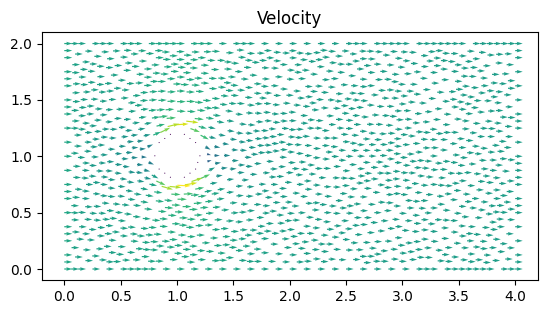

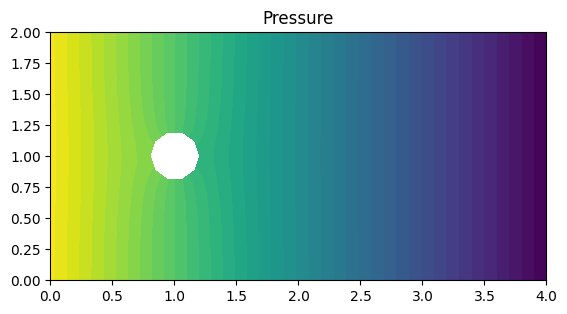

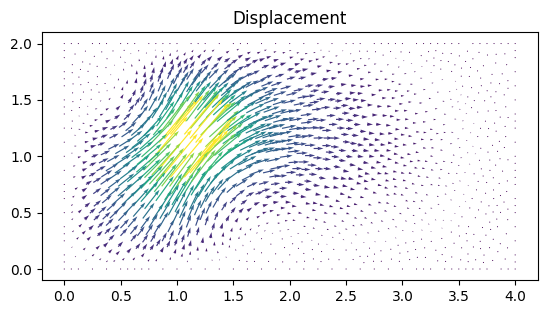

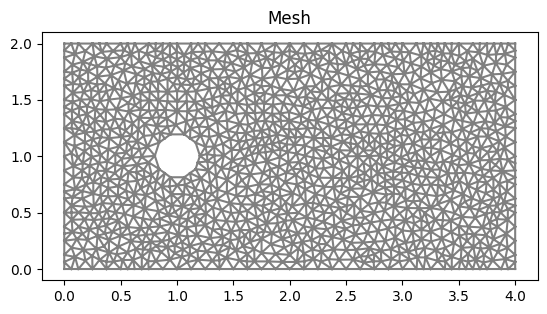

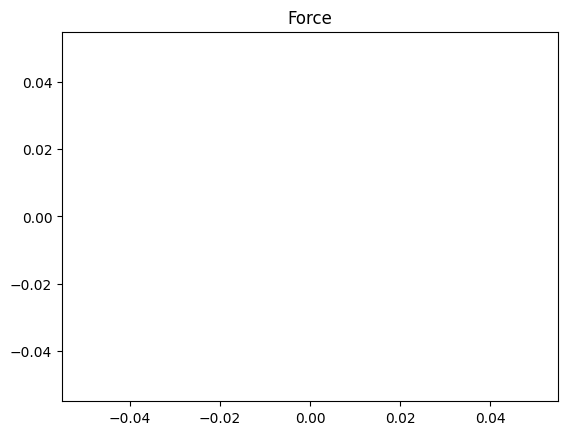

Time t = 1.5113328371191124


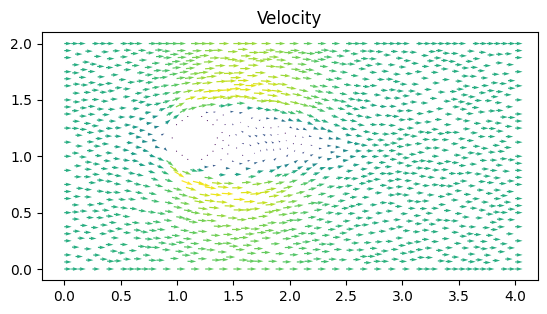

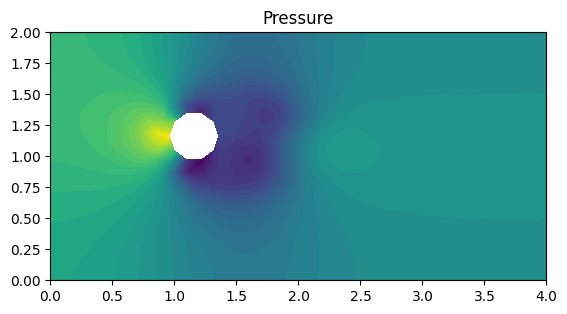

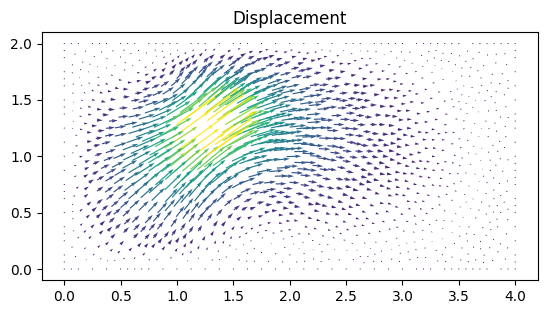

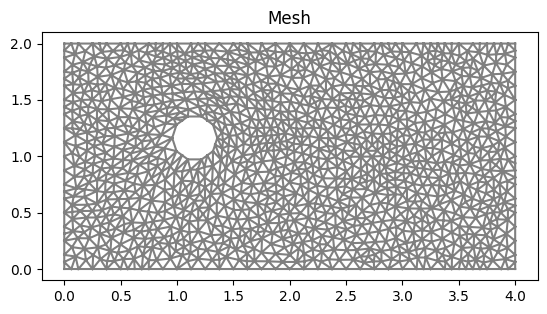

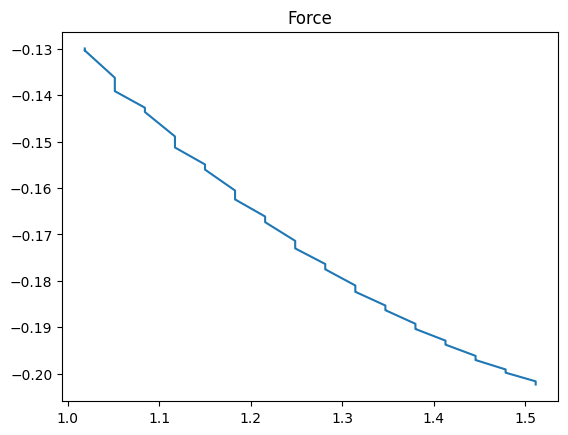

Time t = 3.022665674238231


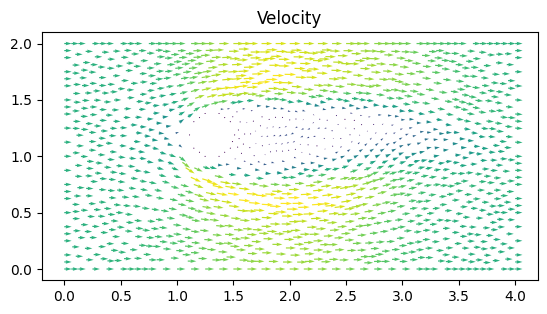

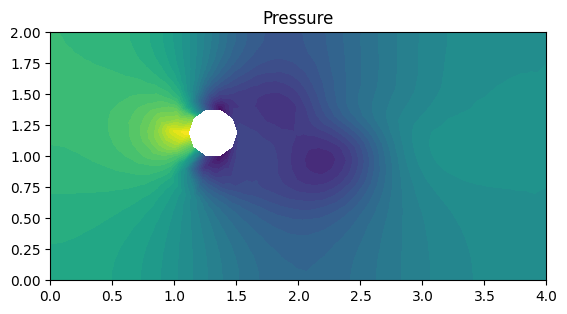

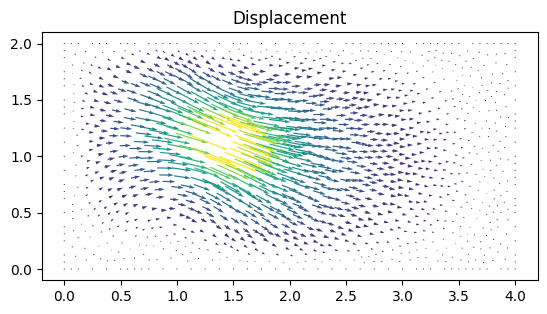

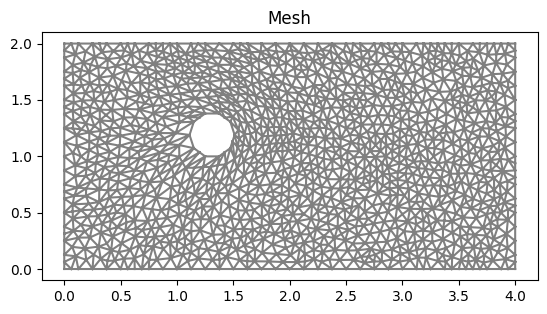

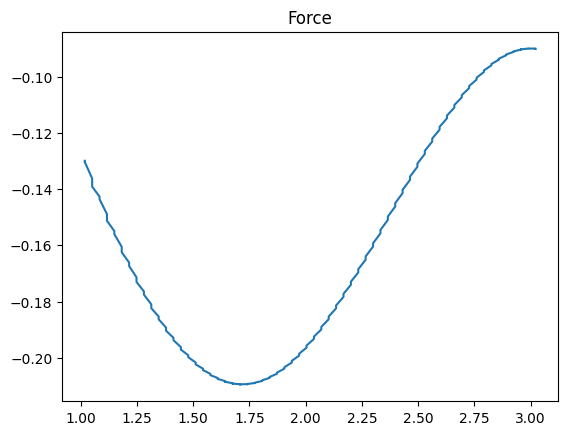

Time t = 4.50114344968085


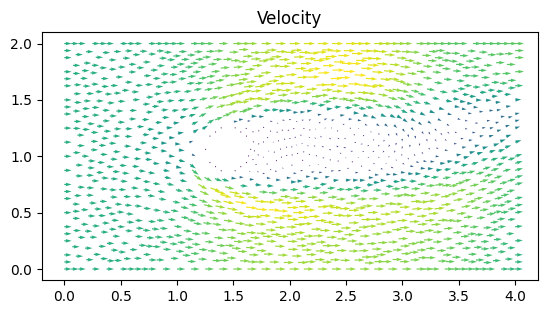

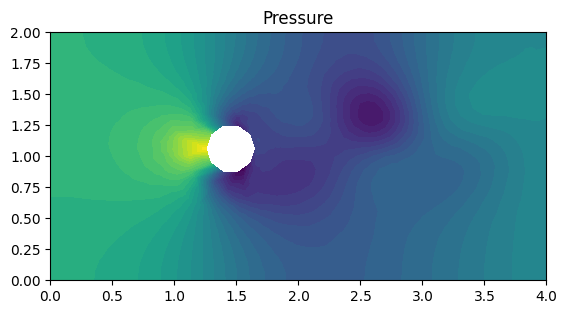

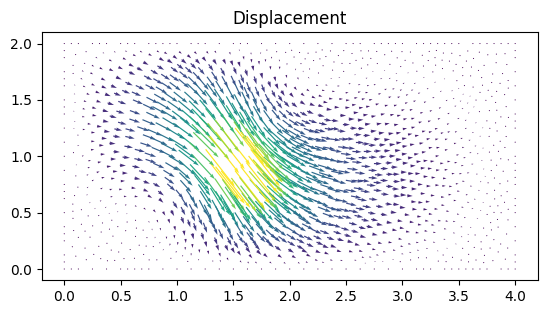

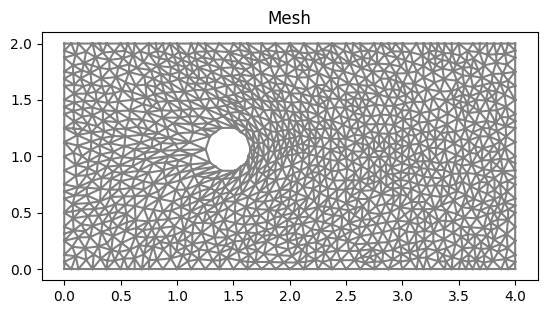

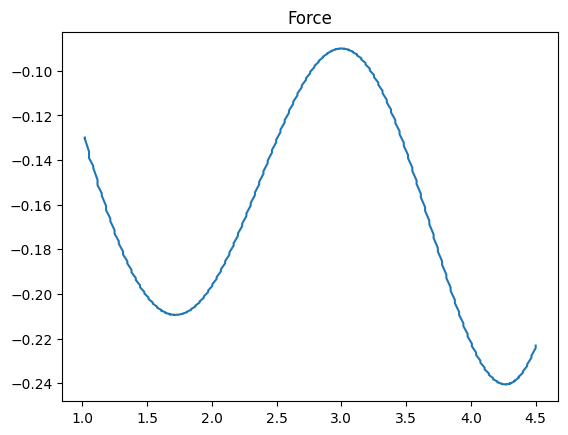

Time t = 6.012476286799972


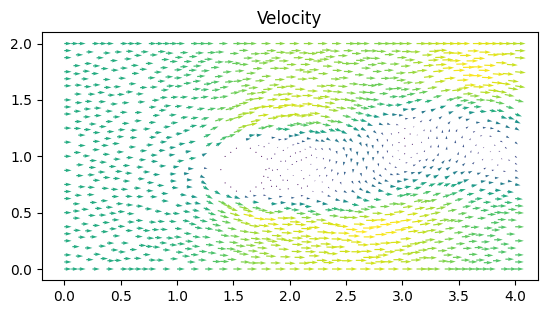

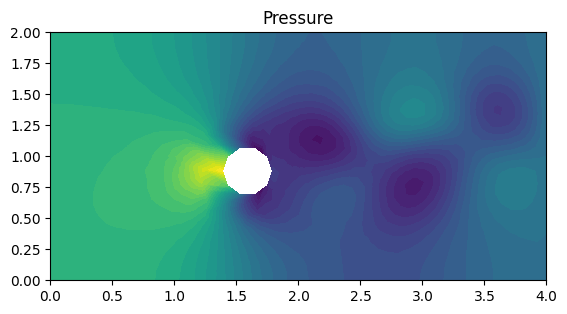

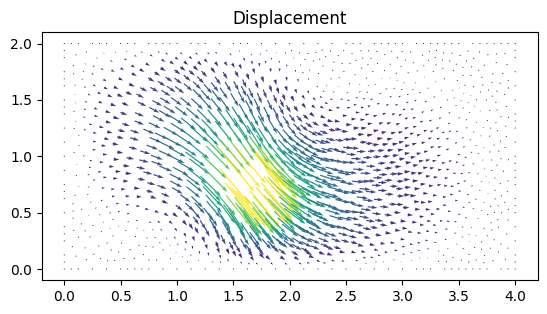

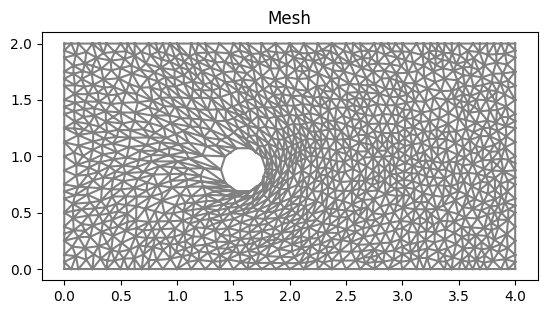

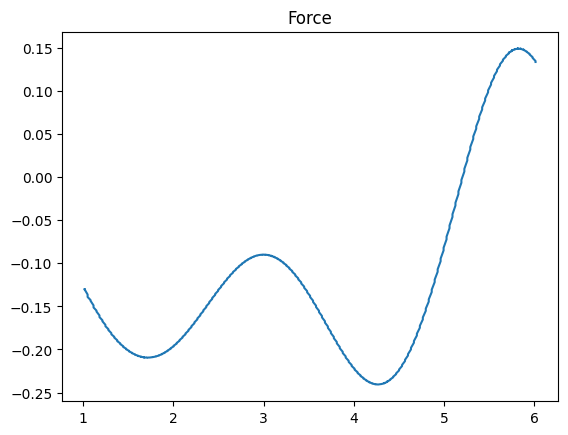

Time t = 7.523809123919094


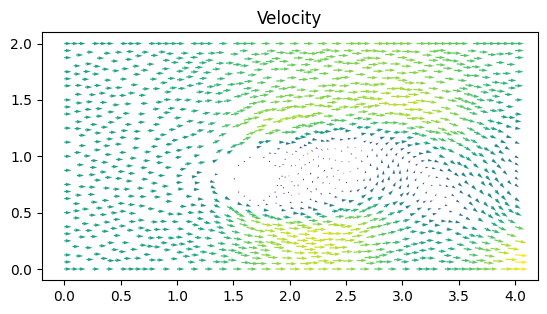

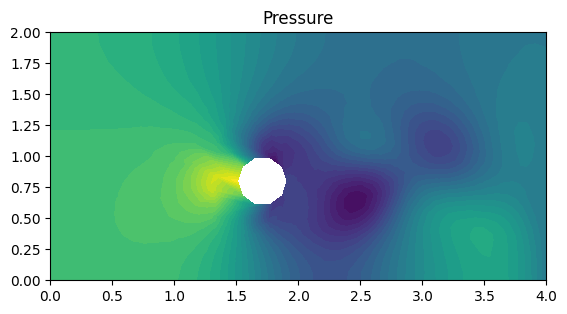

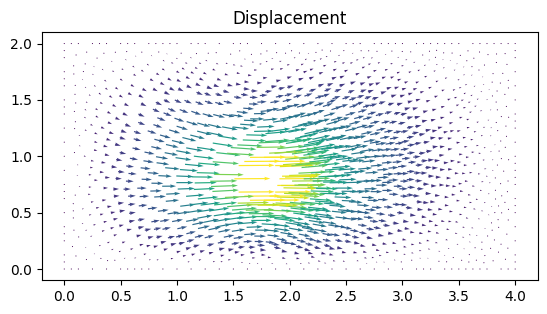

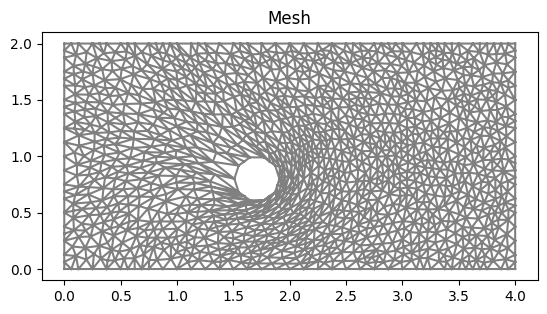

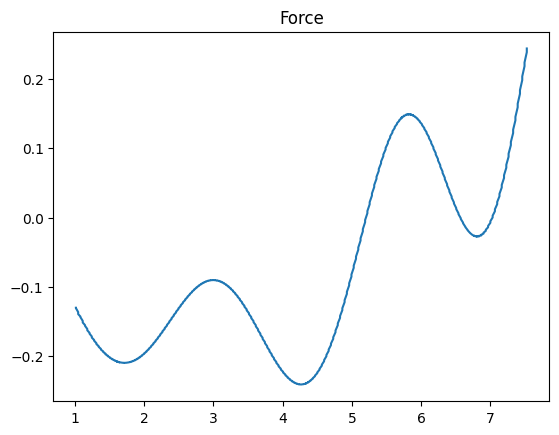

Time t = 9.002286899361685


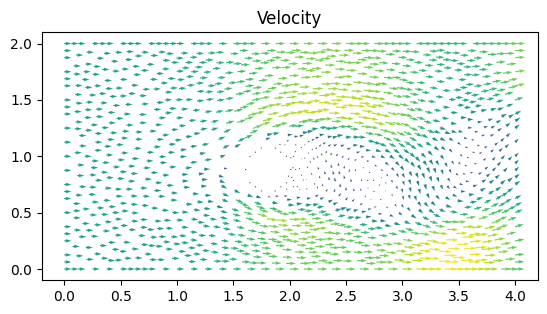

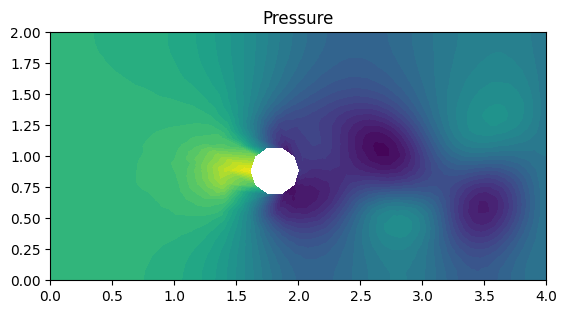

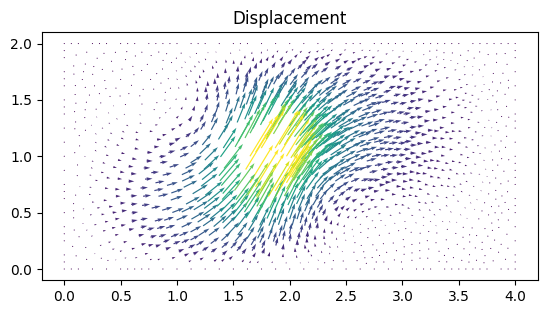

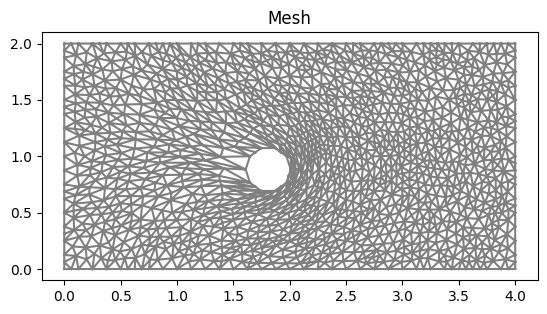

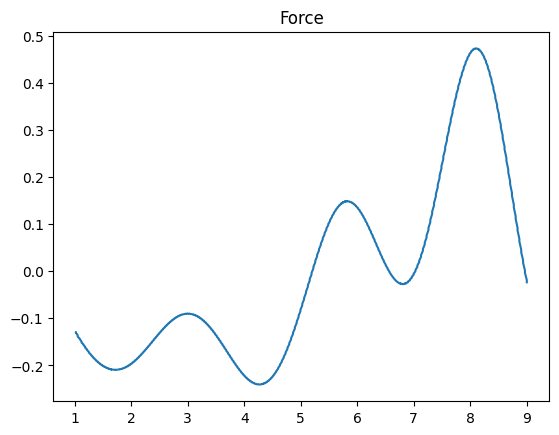

Time t = 10.513619736480766


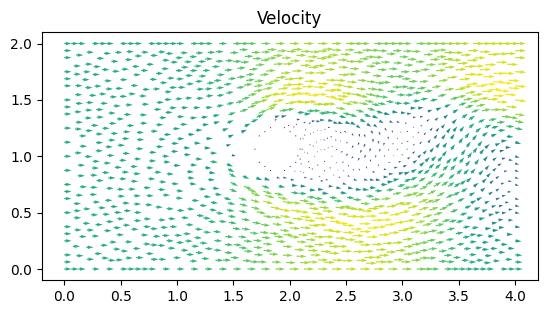

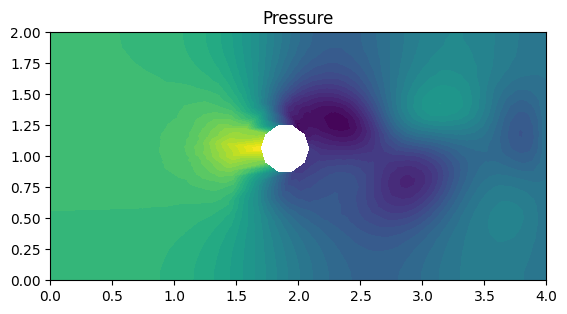

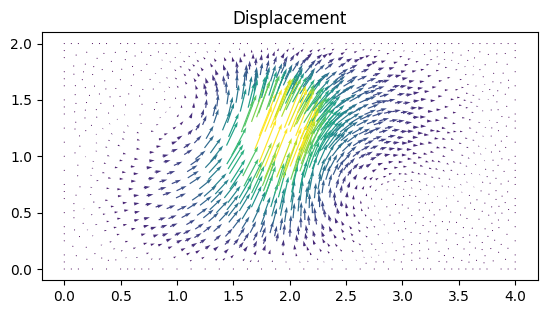

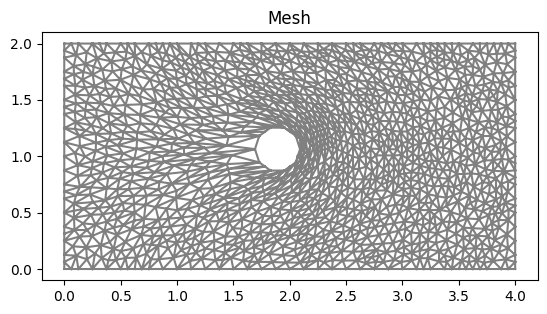

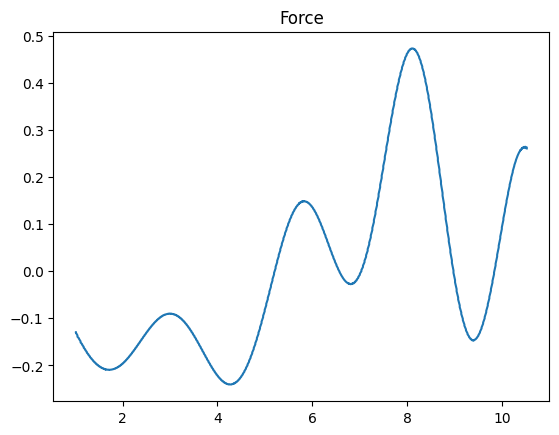

Time t = 12.024952573599847


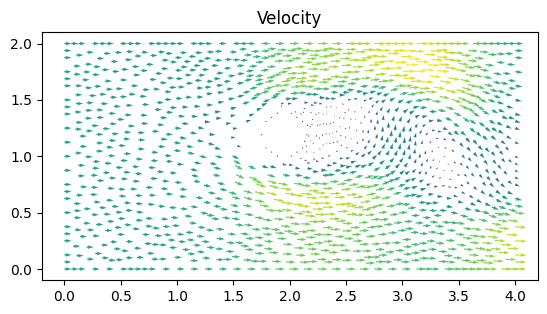

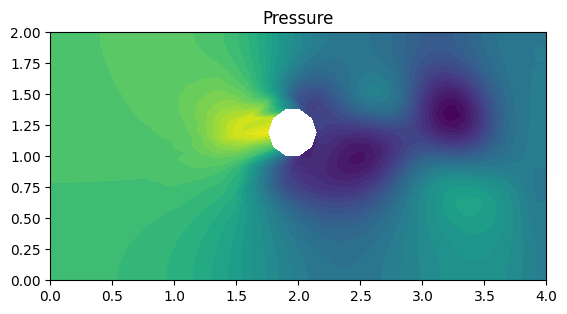

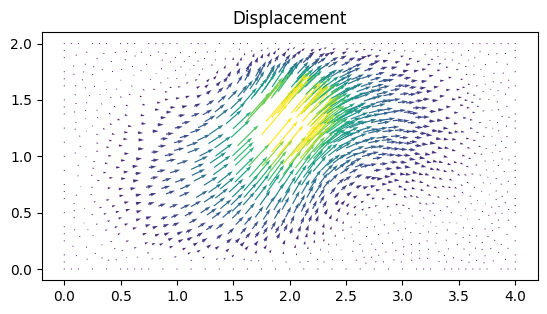

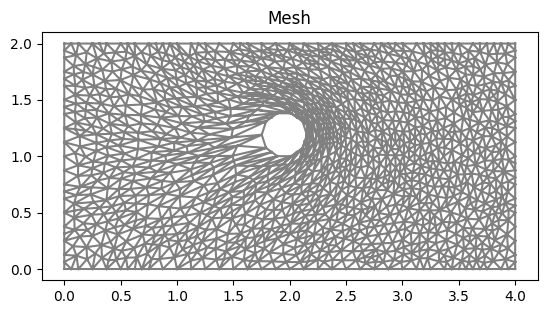

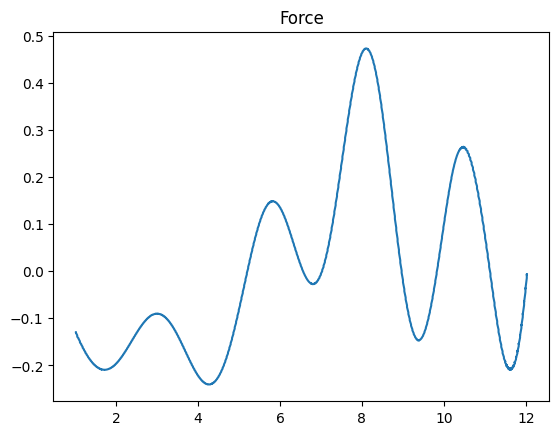

Time t = 13.503430349042427


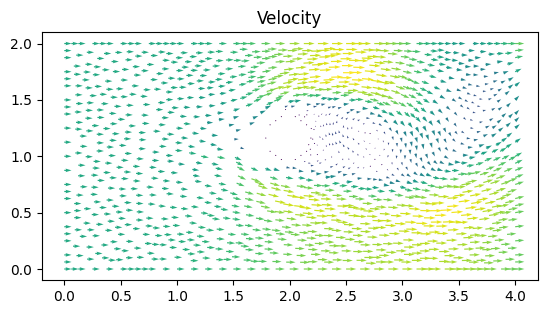

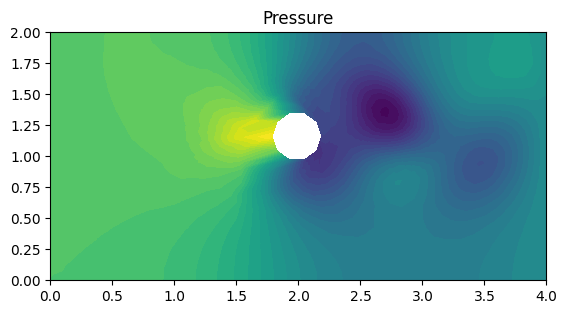

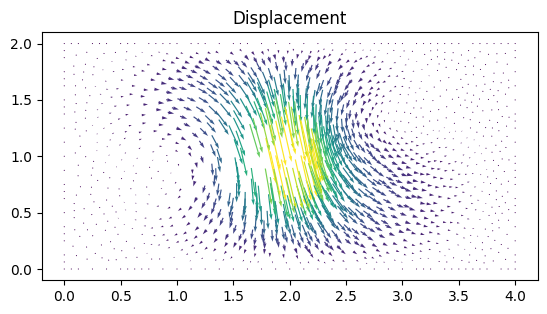

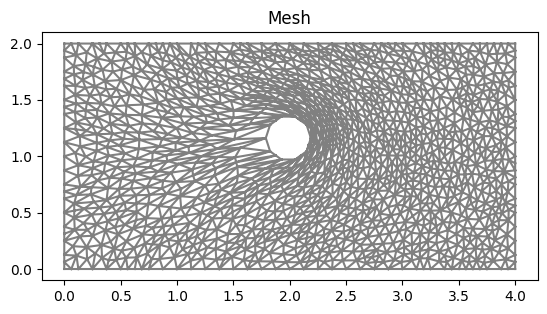

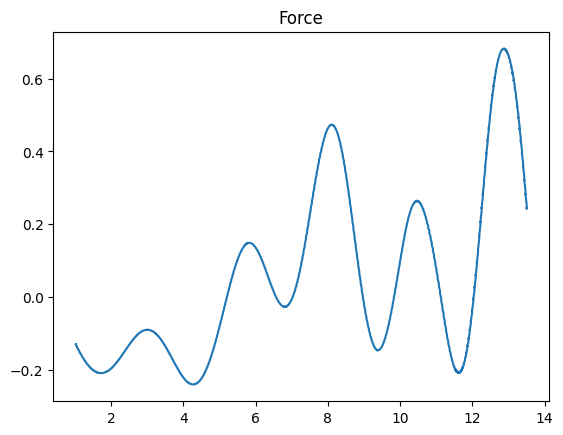

Time t = 15.014763186161508


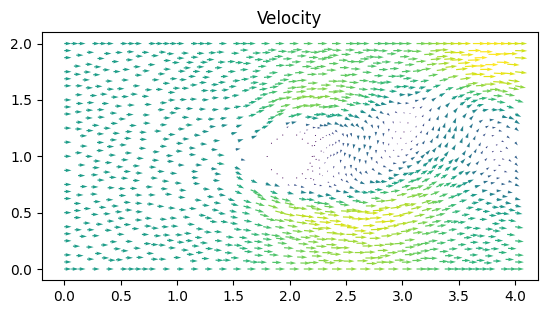

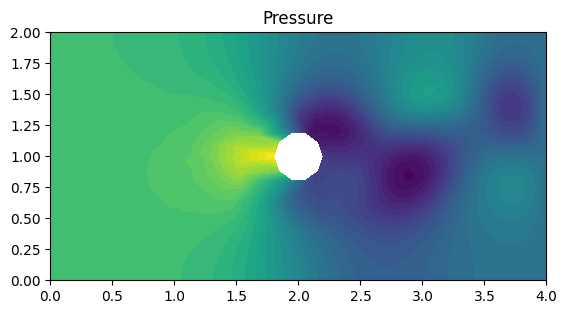

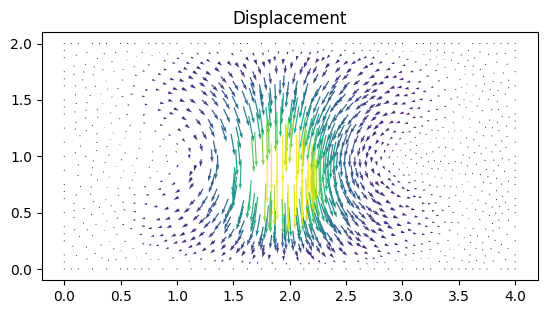

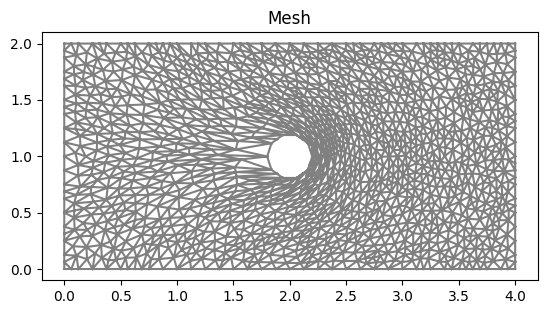

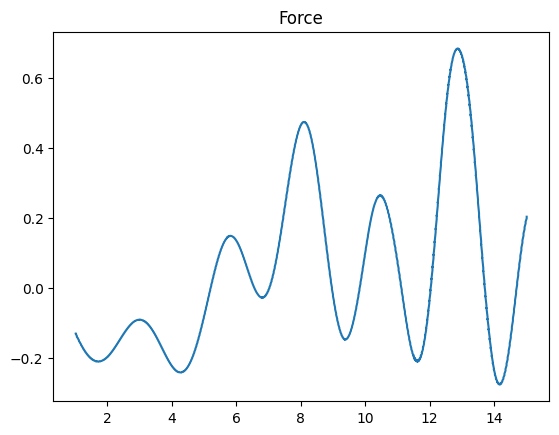

Time t = 16.52609602328062


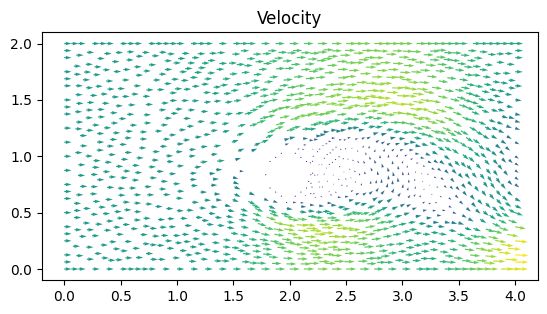

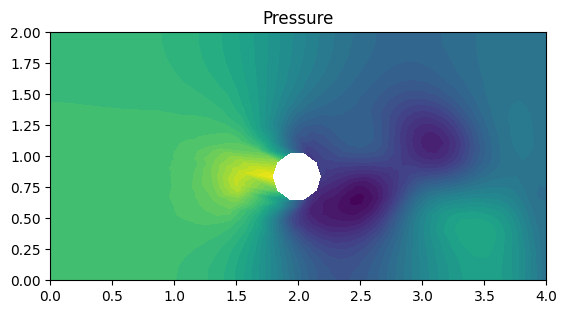

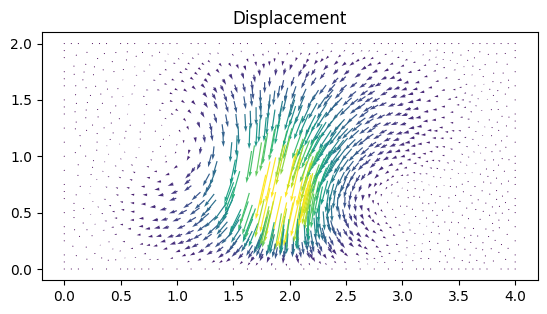

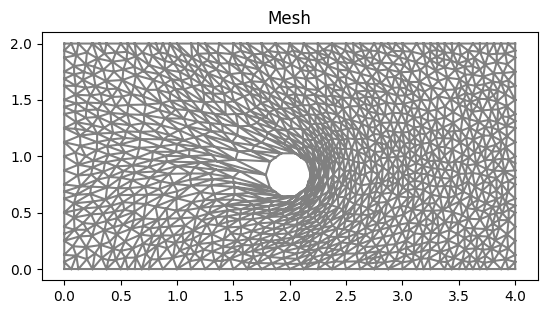

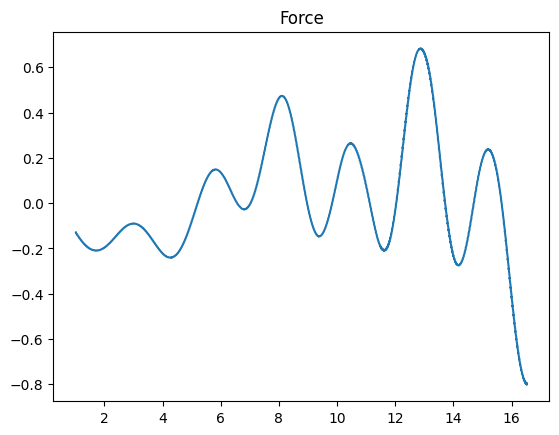

Time t = 18.00457379872328


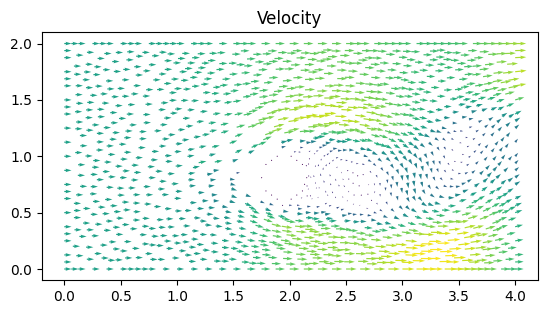

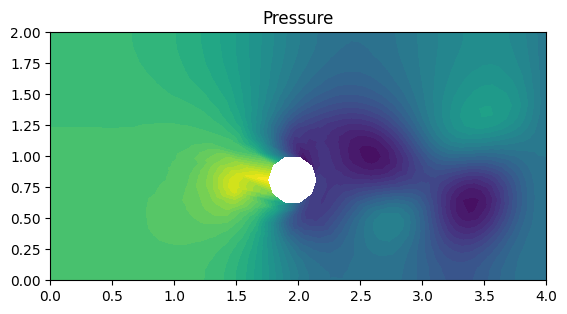

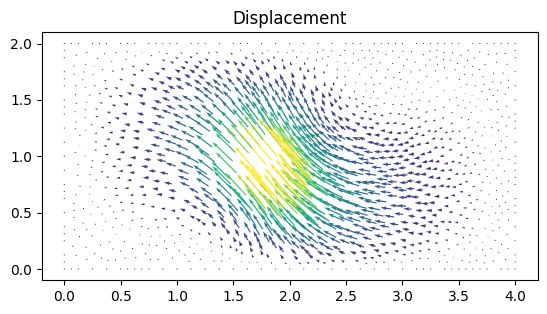

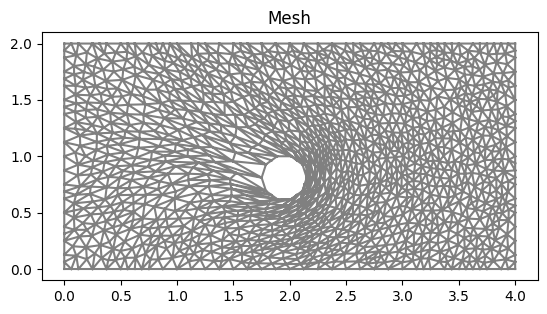

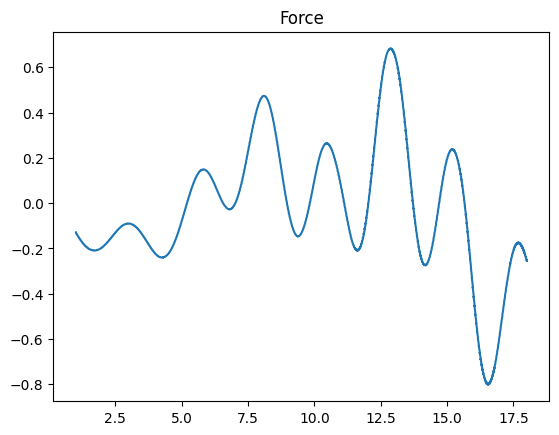

Time t = 19.51590663584244


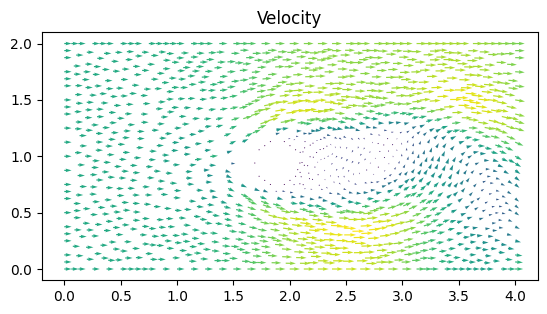

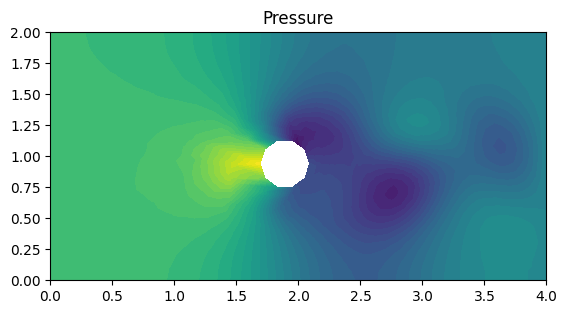

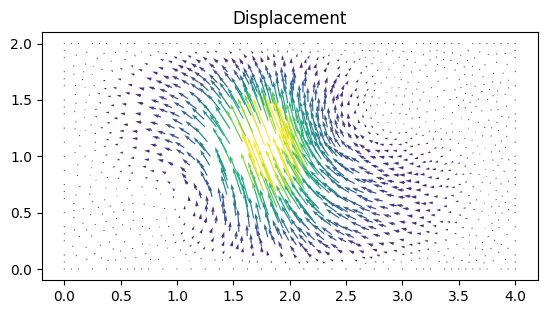

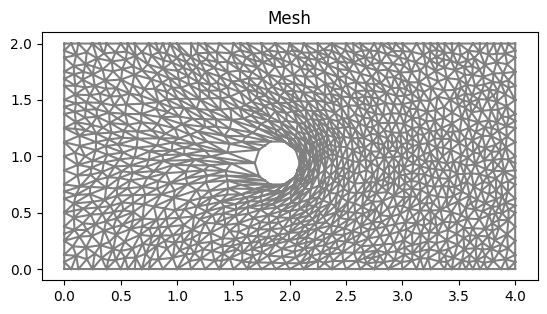

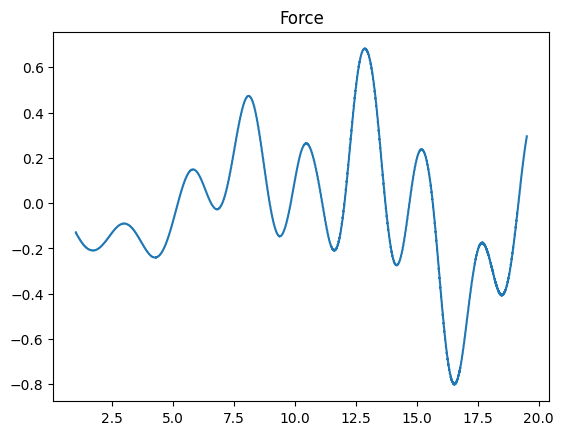

Time t = 21.027239472961604


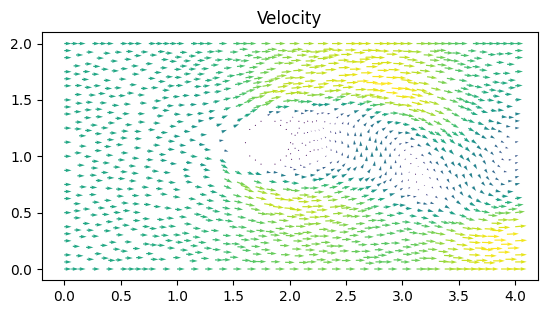

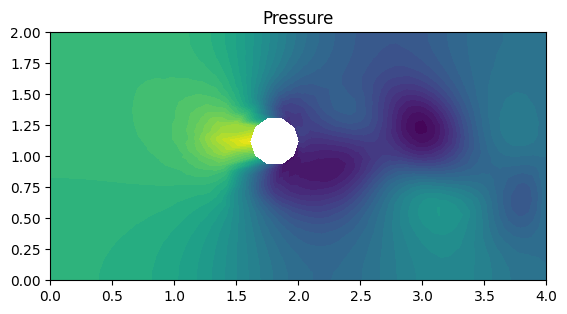

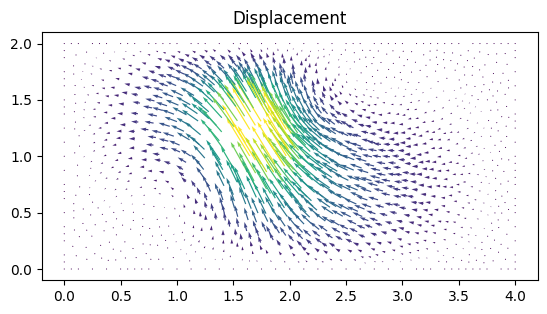

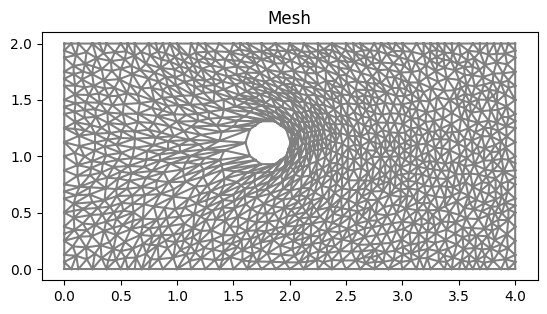

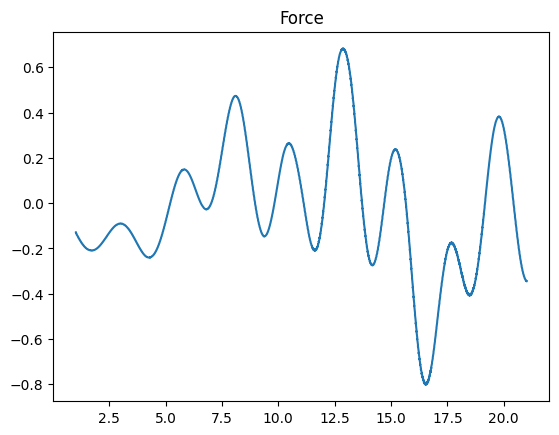

Time t = 22.505717248404263


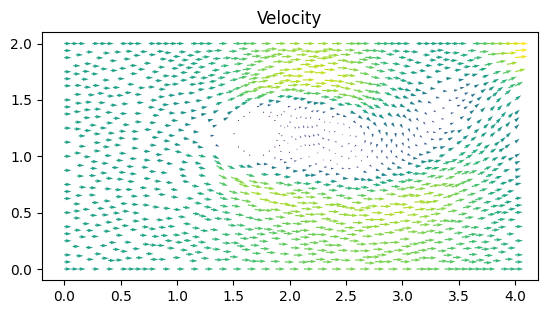

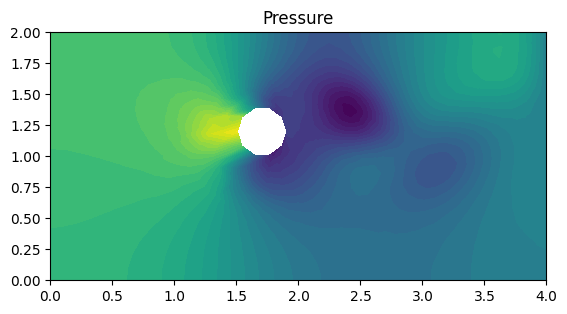

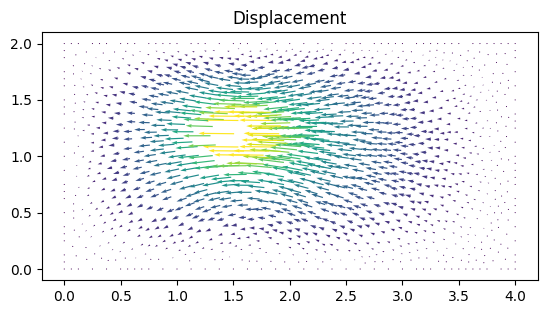

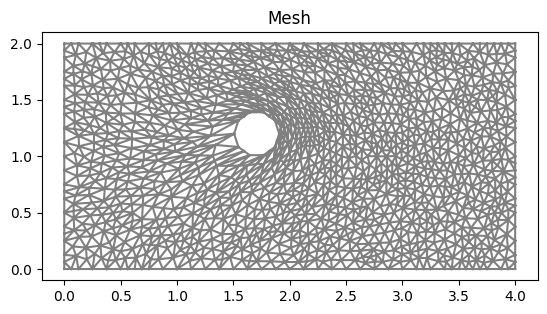

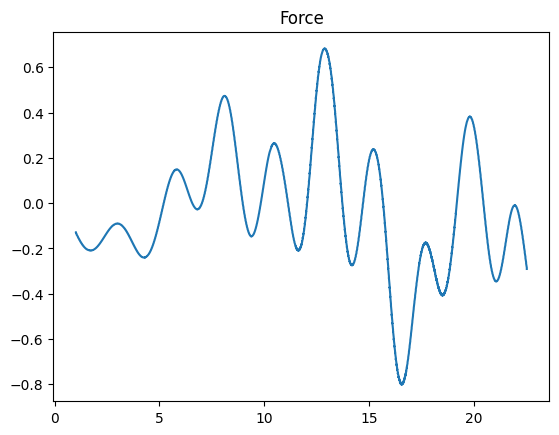

Time t = 24.017050085523426


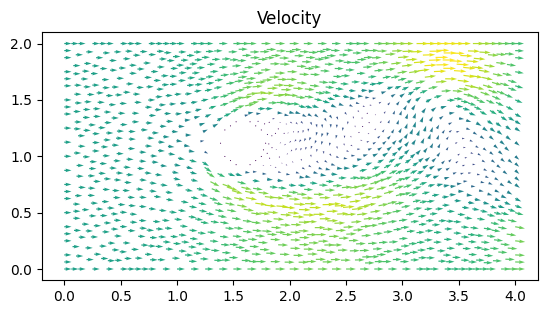

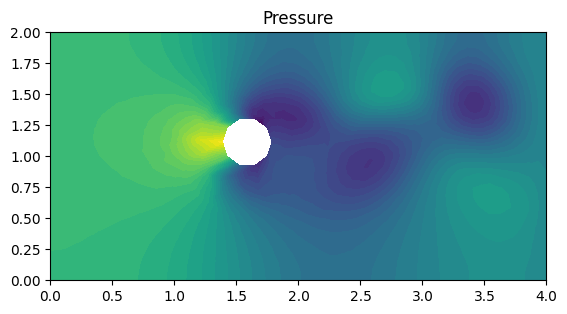

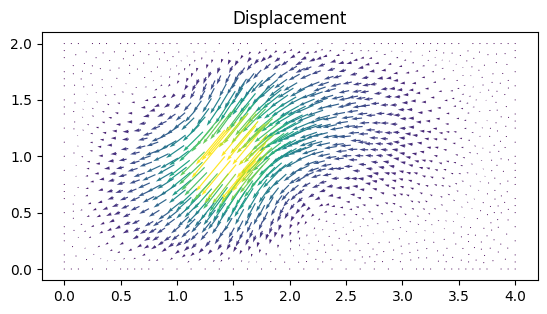

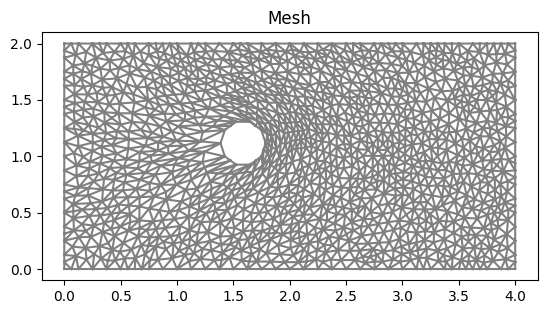

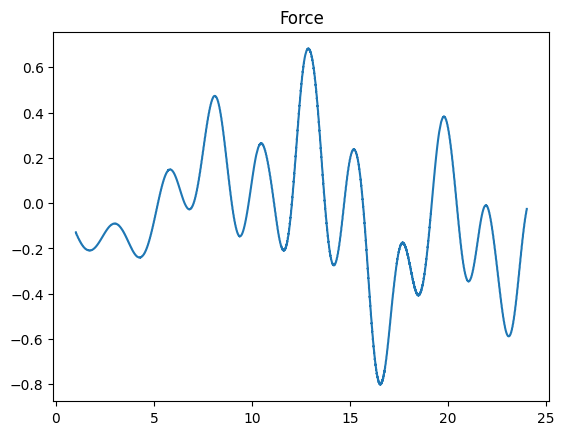

Time t = 25.52838292264259


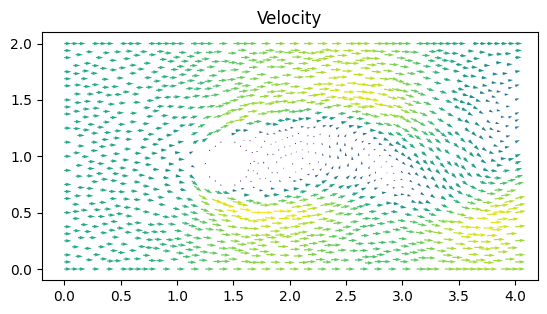

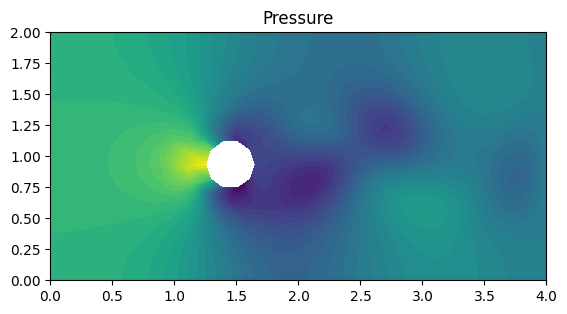

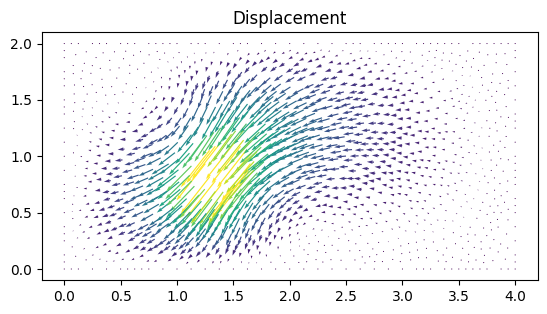

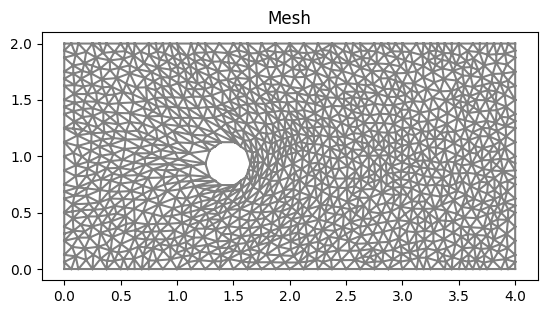

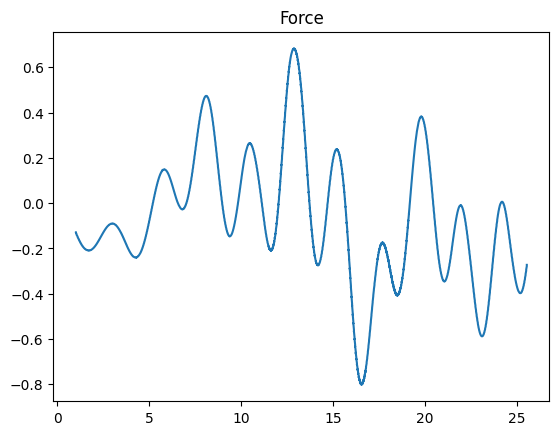

Time t = 27.006860698085248


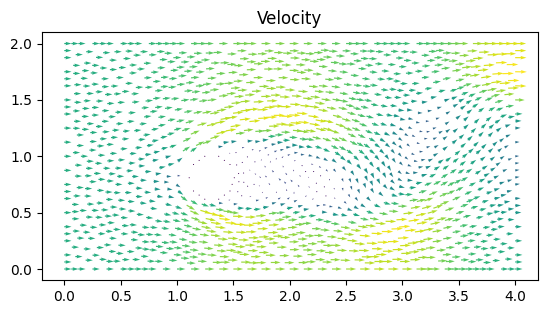

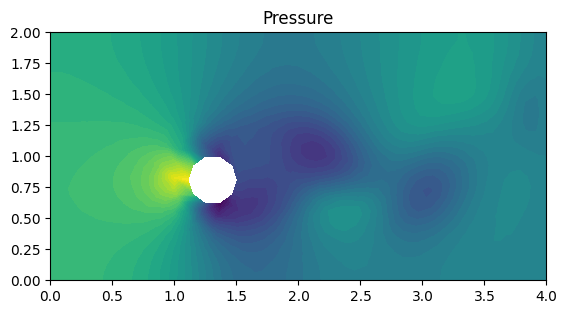

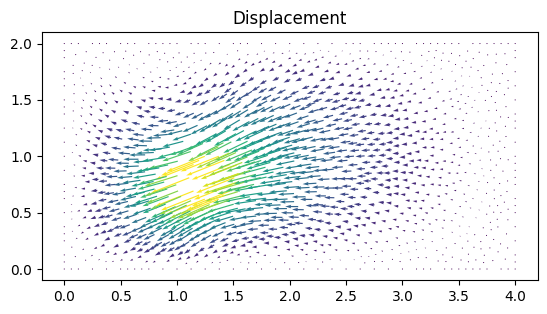

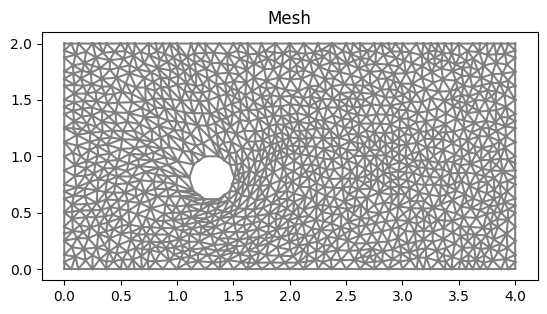

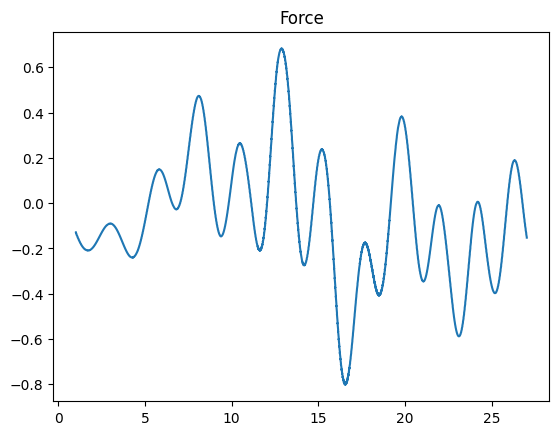

Time t = 28.51819353520441


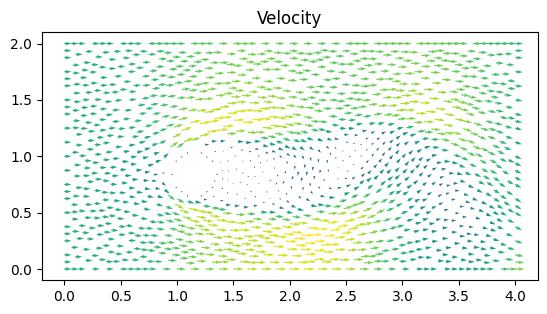

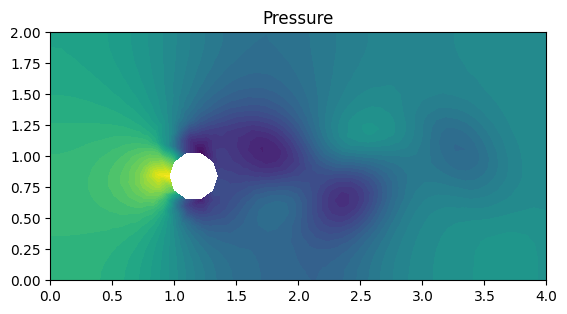

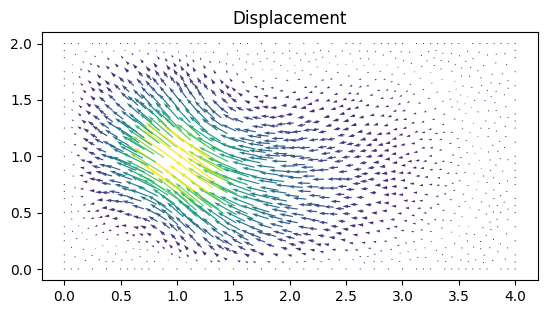

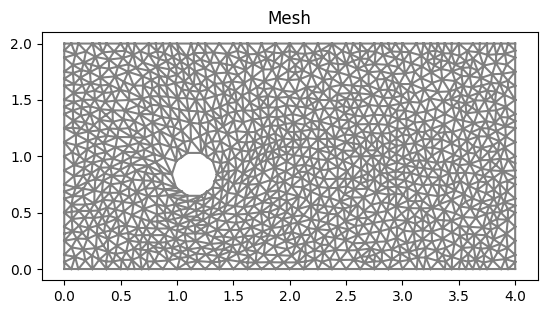

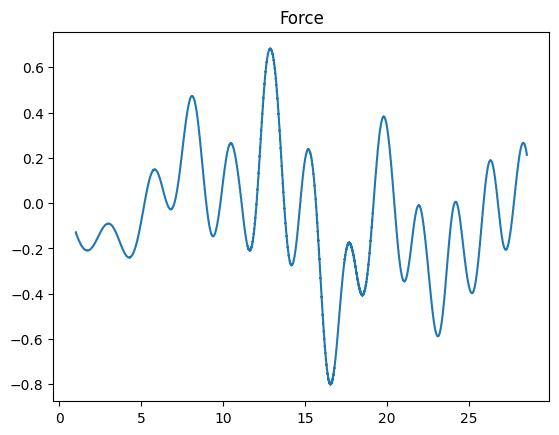

In [298]:
!rm results-NS/*

# Time stepping 
T = 30
t = dt

while t < T + DOLFIN_EPS:

    #s = 'Time t = ' + repr(t) 
    #print(s)

    pin.t = t
    #uin.t = t

    #w.t = t
    #ALE.move(mesh, w)
    # Mesh smoothing
    d, V_elastic = compute_displacement(mesh, t, dt, T)
    ALE.move(mesh, d)

    # Solve non-linear problem 
    k = 0
    while k < num_nnlin_iter: 
        
        # Assemble momentum matrix and vector 
        Au = assemble(au)
        bu = assemble(Lu)

        # Compute velocity solution 
        [bc.apply(Au, bu) for bc in bcu]
        [bc.apply(u1.vector()) for bc in bcu]
        solve(Au, u1.vector(), bu, "bicgstab", "default")

        # Assemble continuity matrix and vector
        Ap = assemble(ap) 
        bp = assemble(Lp)

        # Compute pressure solution 
        [bc.apply(Ap, bp) for bc in bcp]
        [bc.apply(p1.vector()) for bc in bcp]
        solve(Ap, p1.vector(), bp, "bicgstab", prec)

        # Compute force
        F = assemble(Force)
        if (t > start_sample_time):
          force_array = np.append(force_array, normalization*F)
          time = np.append(time, t)

        k += 1

    if t > plot_time:     
        
        s = 'Time t = ' + repr(t) 
        print(s)
    
        # Save solution to file
        file_u << u1
        file_p << p1

        # Plot solution
        plt.figure()
        plot(u1, title="Velocity")

        plt.figure()
        plot(p1, title="Pressure")

        # Mesh smoothing
        d1 = project(d, V_elastic)
        plt.figure()
        plot(d1, title="Displacement")

        plt.figure()
        plot(mesh, title="Mesh")
        
        plot_time += T/plot_freq
        
        plt.show()

        plt.figure()
        plt.title("Force")
        plt.plot(time, force_array)
        plt.show()

    # Update time step
    u0.assign(u1)
    t += dt

#!tar -czvf results-NS.tar.gz results-NS
#files.download('results-NS.tar.gz')

# **Discussion**

A stabilized finite element method was implemented in FEniCS to solve the Navier-Stokes equations in 2D using an ALE finite element method. 

## Mesh deformation

### Move and deform

We start by moving the cylinder up and down periodically while deforming it at the same time and computing the corresponding lift and drag forces.

The following three images show the mesh in the initial state and then close to the bottom and top of the movement where we can clearly see the cylinder being compressed in the latter two cases.

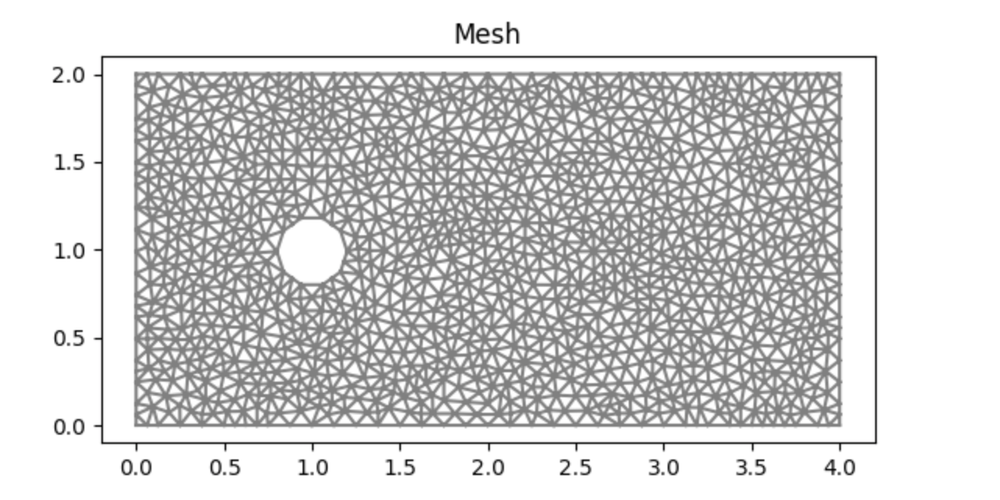

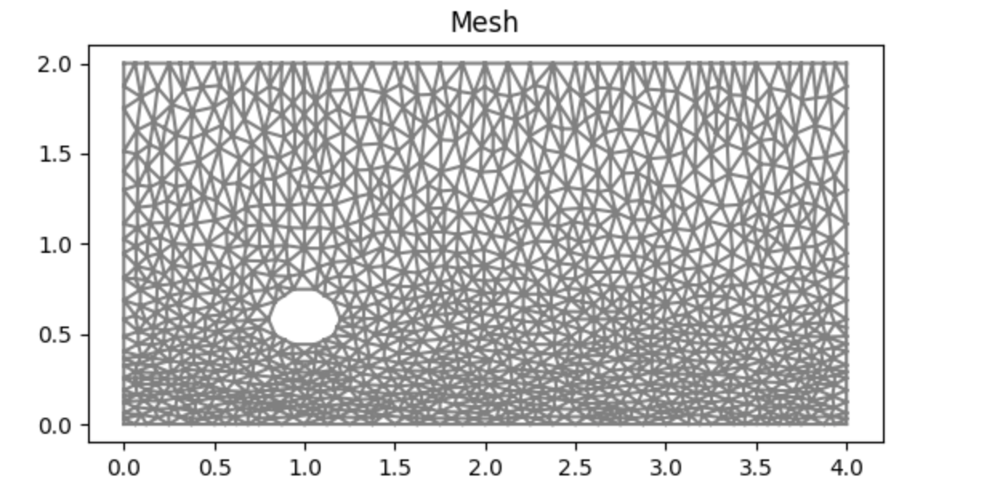

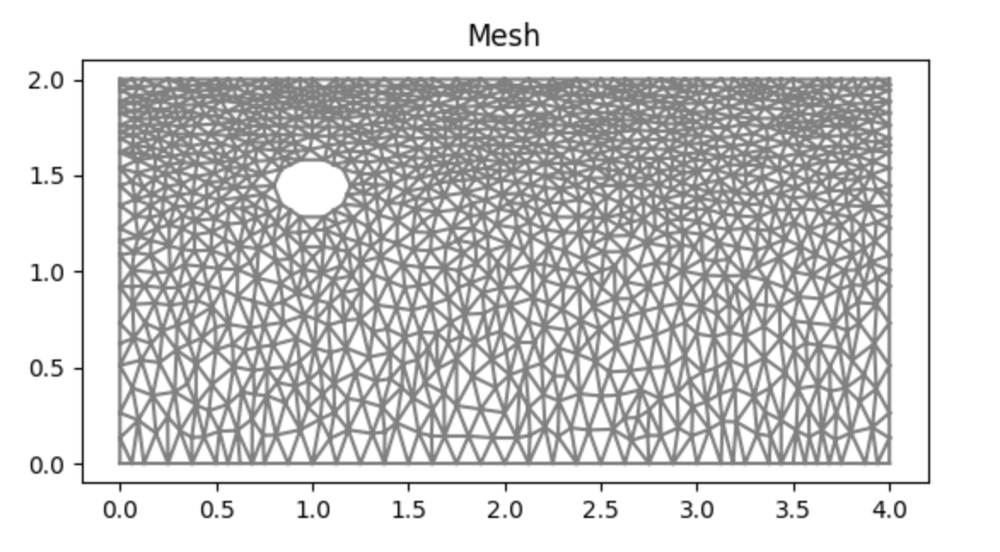

The corresponding drag force also shows these oscillations and has minima at the bottom/top of the movement and maxima in the initial position (frequency of 0.1). This makes sense intuitively as the lower surface area of the cylinder due to the deformation at the top/bottom leads to a drag reduction.

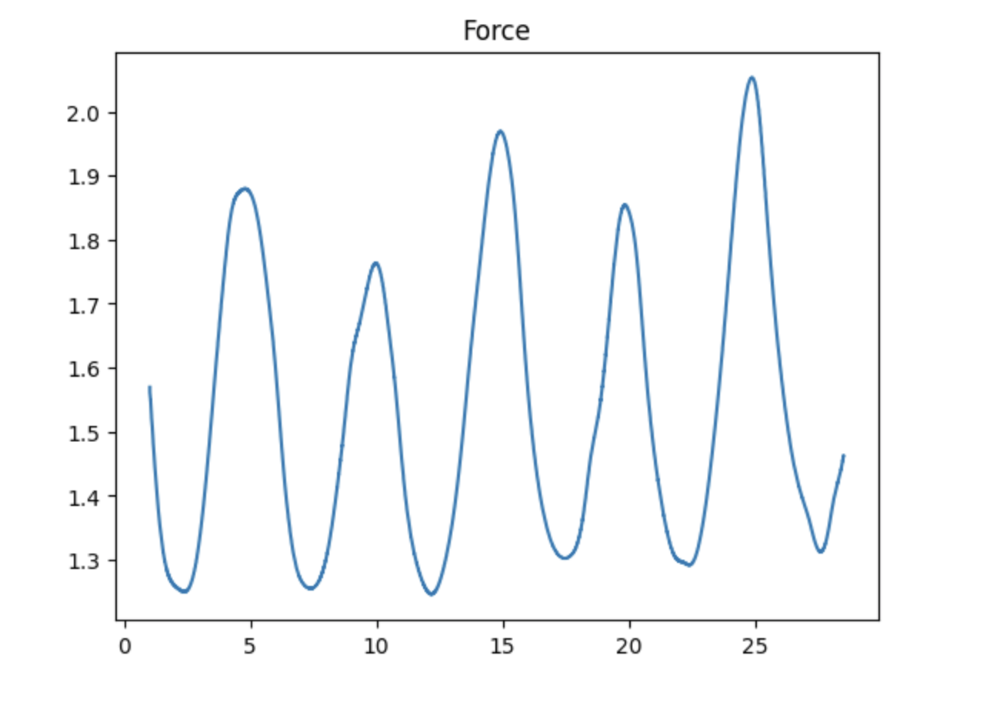

The lift force on the other hand oscillates around zero, taking on positive values during the upwards motion and negative value during the downward movement. This can be explained by the fact the during the upward motion more of the fluid gets pushed below the cylinder, thus creating a force in the direction of the motion (and vice versa for the downward case).

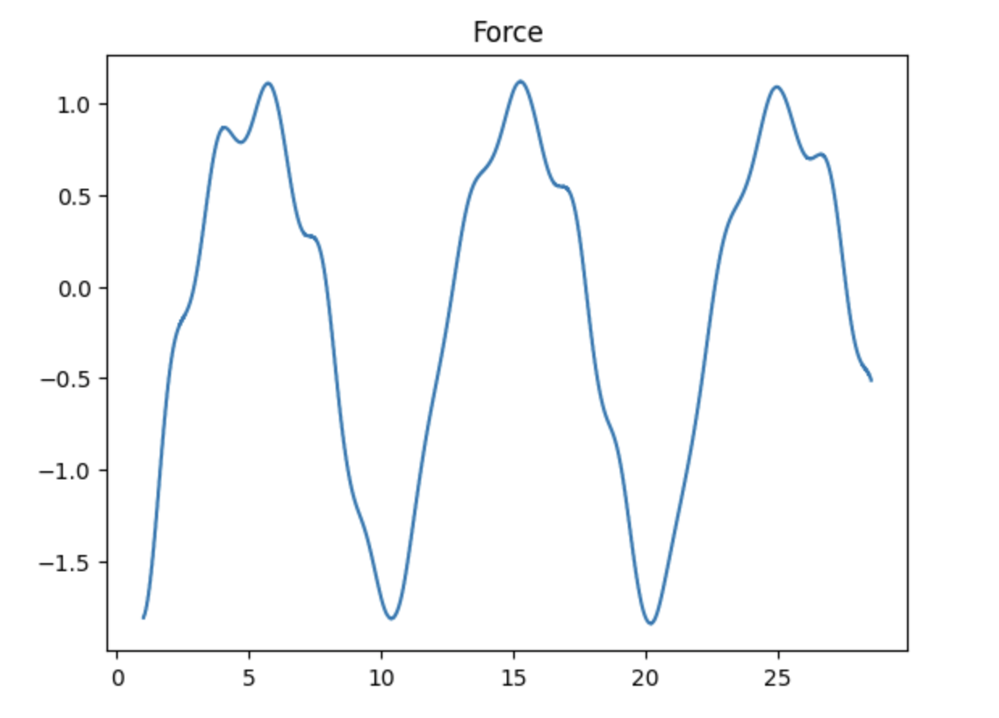

### Only deformation

Next, we fix the position of the cylinder, but have it still deform in y-direction with the same frequency as before such that the mesh at different times looks like the following:

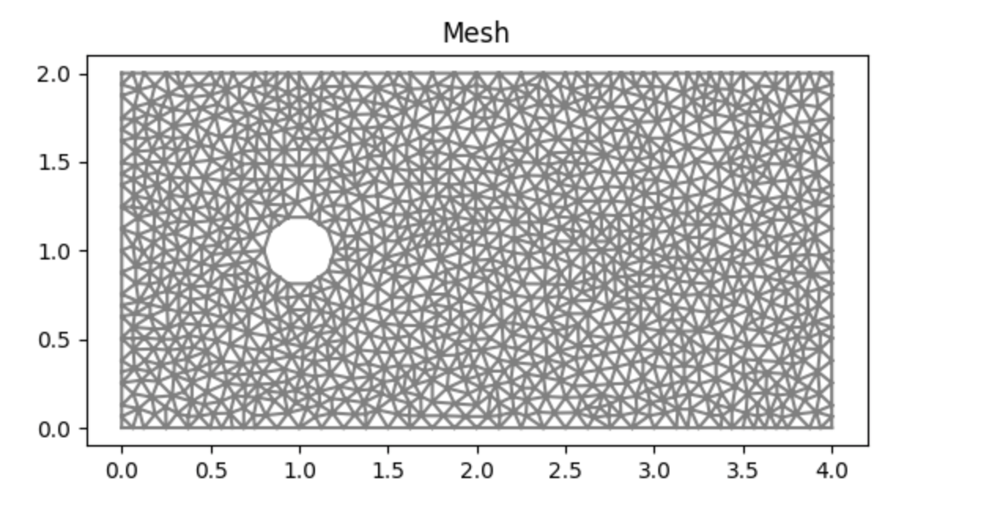

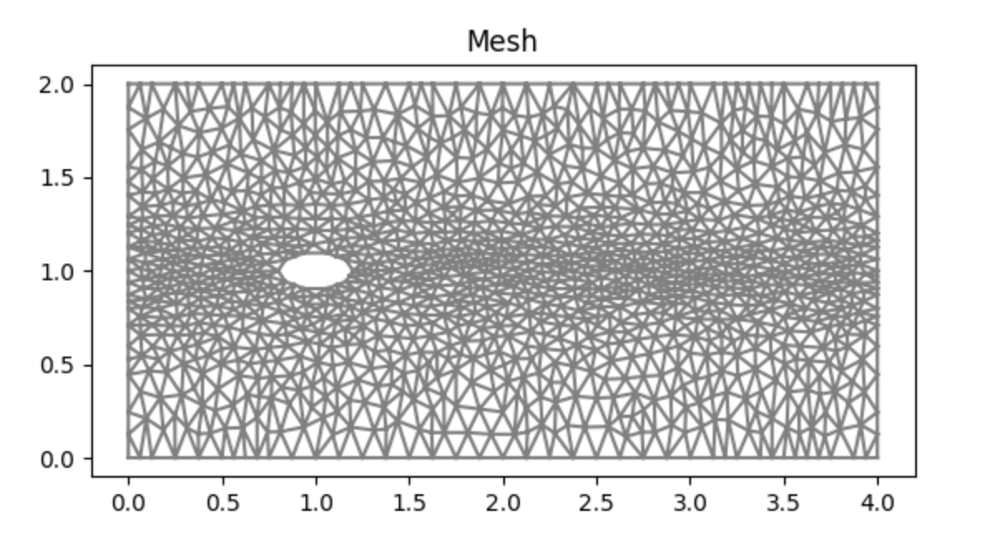

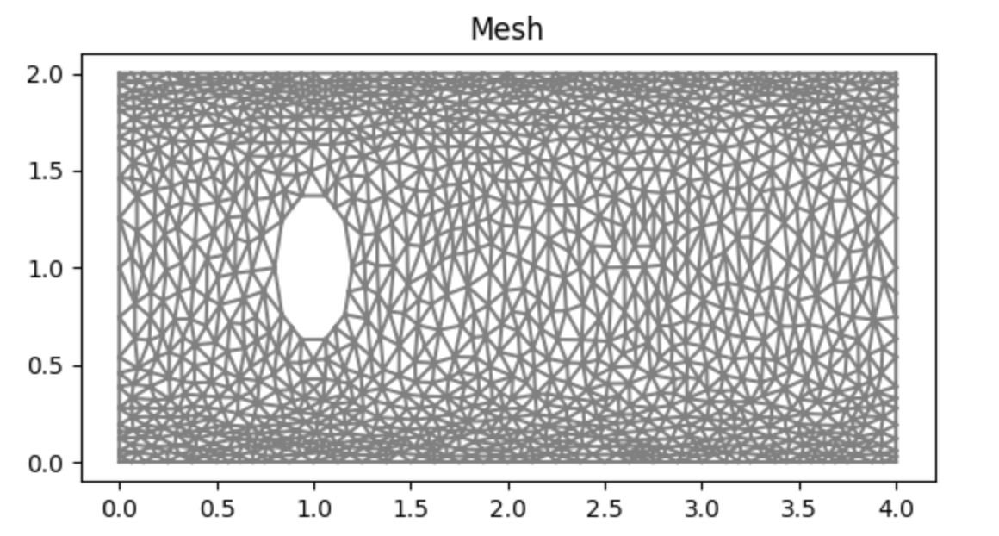

As expected, the corresponding drag force again oscillates, with peaks when the cylinder is stretched to the maximum and lows when it is compressed.

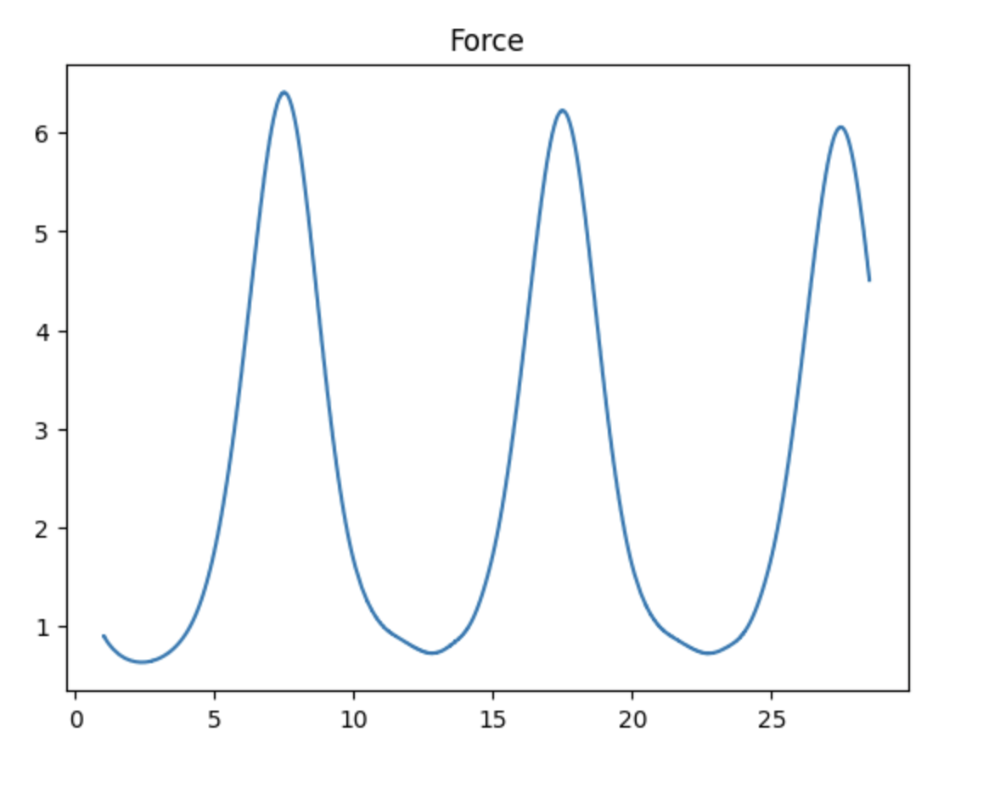

The lift force is smaller than before in terms of absolute value and also shows more irregularities. For the most part, it seems to be positive during the compression period (e.g. (7.5s, 12.5s)) and negative during the extension (e.g. 12.5 to 17.5s), but it is hard to tell from just the plots since it could also be aligned with the mesh acceleration.

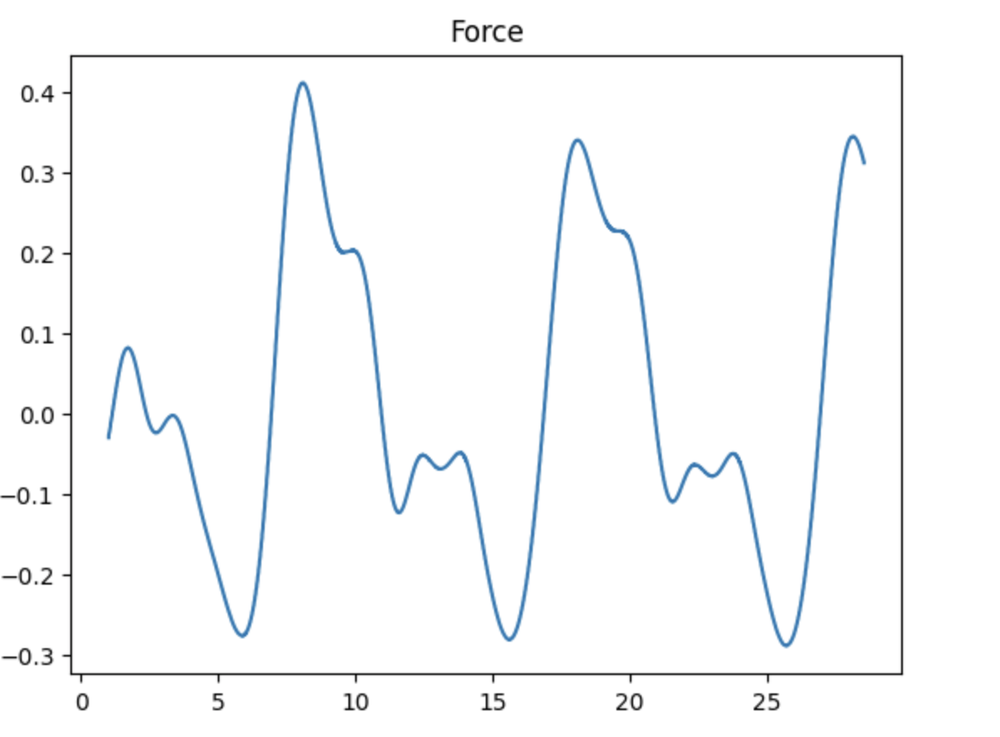

## Optional task: Mesh smoothing

For this task, we do not want to prescribe the movement of the mesh, but rather move the cylinder, compute the elastic reponse and use that to update the mesh.

To do so, we define a function 'compute_displacement' (see Section 'Define Method Parameters') that computes the elastic response based on the cylinder movement given the current time t. This function largely corresponds to the template file for the elastic equation. As an example, sinusoidal cylinder movement in x and y direction with different amplitude and frequency has been tested using the material properties $E = 10^{10}$ and $\nu = 0.3$. In every iteration of the time stepping scheme, we start by calculating the displacement and updating the mesh and then solving the Navier-Stokes equation for $u$ and $p$. The output for the tested example can be found above where we see displacement mostly in the movement-direction due to the rather hard material and the constant shape of the cylinder (no deformation, compare with very first results).